<a href="https://colab.research.google.com/github/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/blob/main/model_build.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [45]:
!pip install category_encoders

In [46]:

!wget https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/train_df.csv -O 'train_df.csv'
!wget https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/validation_df.csv -O "validation_df.csv"

--2023-11-09 17:35:18--  https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/train_df.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23875034 (23M) [text/plain]
Saving to: ‘train_df.csv’

train_df.csv        100%[===================>]  22.77M   125MB/s    in 0.2s    

2023-11-09 17:35:18 (125 MB/s) - ‘train_df.csv’ saved [23875034/23875034]

--2023-11-09 17:35:18--  https://raw.githubusercontent.com/hugomilesi/Predictions-for-Brazillian-Car-Prices-2023-/main/data/validation_df.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP 

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# models
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pickle
from sklearn.tree import DecisionTreeRegressor
from category_encoders.target_encoder import TargetEncoder

# metrics
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, explained_variance_score, mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression

In [48]:
df = pd.read_csv('/content/train_df.csv')
df = df.iloc[:, 1:]

In [49]:
df.tail()

,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,avg_price_brl,age_years
249893,2022,December,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2009,22894.0,14
249894,2022,December,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2008,22270.0,15
249895,2022,December,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2007,21663.0,16
249896,2022,December,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2006,21073.0,17
249897,2022,December,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2005,18264.0,18


# Data Preprocessing

In [50]:
# splitting features and label
x, y = df.drop("avg_price_brl", axis = 1), df['avg_price_brl']

In [51]:

cat_data = ['month_of_reference', 'brand', 'model']
num_data = ['engine_size', 'year_model', 'age_years', 'year_of_reference']

scaler = StandardScaler()
enc = TargetEncoder(x[cat_data])


# Define the numerical and categorical features({'manual': 0, 'automatic': 1})

# ordinal encoding fuel
fuel_type = {'Gasoline': 0, 'Diesel': 1, 'Alcohol': 2}
x['fuel']=x['fuel'].replace(fuel_type)
#binary encoding gear
x['gear'] = x['gear'].replace({'manual': 0, 'automatic': 1})
# target ecoding
x[cat_data] = enc.fit_transform(x[cat_data], y)
# Standardize numerical columns
scaler.fit(x[num_data])
x[num_data] = scaler.transform(x[num_data])


x.head()


,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,age_years
0,0.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.382268,1.382268
1,0.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.493669,1.493669
2,0.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.605070,1.605070
3,0.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.716471,1.716471
4,0.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.827872,1.827872


In [52]:
# saving the encoders
with open('scaler.pickle', 'wb') as f:
    pickle.dump(scaler, f)

with open('target-encoder.pickle', 'wb') as f:
    pickle.dump(enc, f)


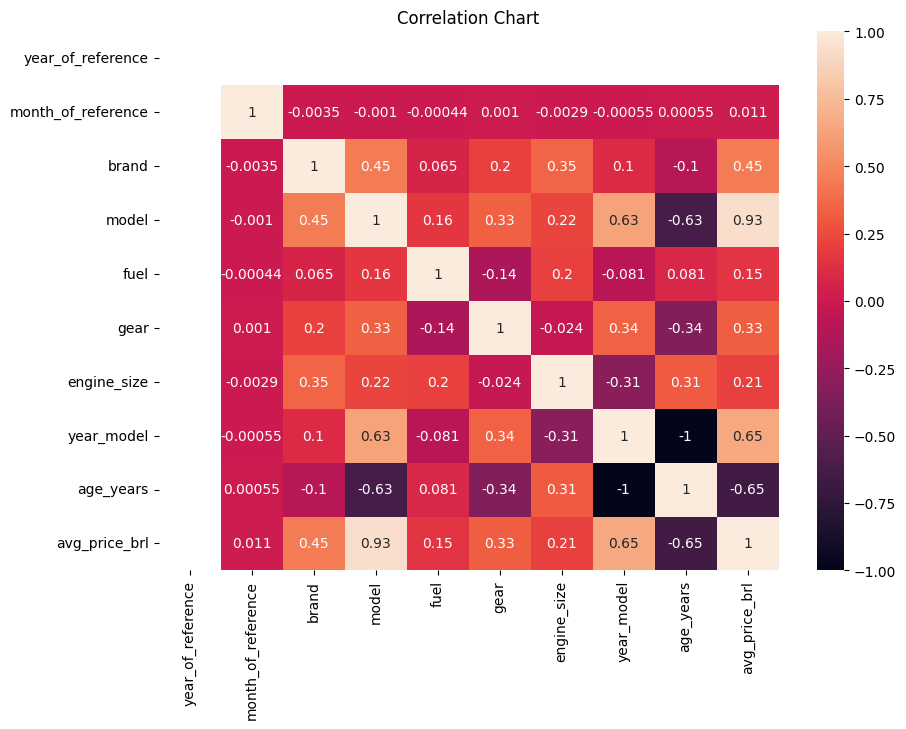

In [53]:
plt.figure(figsize = (10,7))
sns.heatmap(pd.concat([x, y], axis = 1).corr(), annot = True)
plt.title('Correlation Chart')
plt.show()

In [54]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=0)

# Model Building

In [55]:
def train_and_evaluate_models(regressors, X_train, y_train, X_test, y_test, verbose=False):

    """
    This Function Trains multiple models at once and store its metrics in a dataframe for later use.
    """
    results = []

    for regressor in regressors:
        model_results = {}

        # Fit the regressor to the training data
        rg = regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)

        # Calculate various metrics
        mse = round(mean_squared_error(y_test, y_pred), 4)
        r2 = round(r2_score(y_test, y_pred), 4)
        explained_variance = round(explained_variance_score(y_test, y_pred), 4)
        mae = round(mean_absolute_error(y_test, y_pred), 4)

        model_results["Model Name"] = str(regressor).split('(')[0]
        model_results["Mean Squared Error (MSE)"] = mse
        model_results["R-squared (R2) Score"] = r2
        model_results["Explained Variance Score"] = explained_variance
        model_results["Mean Absolute Error (MAE)"] = mae

        results.append(model_results)

        if verbose:
            fig = px.scatter(
                x=y_test, y=y_pred, labels={'x': 'Actual Average Price', 'y': 'Predicted Average Price'},
                title=f"Average Car Price Predictions with {str(regressor).split('(')[0]}", opacity=0.65,
                trendline='ols', trendline_color_override='cyan'
            )

            fig.show()
        print(f"Model Overall Score: {regressor.score(X_test, y_test)}")
        print(f"Mean Squared Error(MSE):   {mse}")
        print(f"R-squared (R2) Score:      {r2}")
        print(f"Explained Variance Score:  {explained_variance}")
        print(f"Mean Absolute Error (MAE): {mae}")


    # Create a pandas DataFrame from the results
    results_df = pd.DataFrame(results)

    return results_df


In [56]:
# defining the models
lr_model = LinearRegression( fit_intercept = True)
gbr_regressor = GradientBoostingRegressor(random_state=42)
rf_regressor = RandomForestRegressor(random_state=42)
dt_regressor = DecisionTreeRegressor(random_state=42)

# create a list of regressors and call the function to train and evaluate them
regressors = [lr_model, gbr_regressor, rf_regressor, dt_regressor]  # Replace with your regressor instances
results_df = train_and_evaluate_models(regressors, X_train, y_train, X_test, y_test, verbose=True)

Model Overall Score: 0.8857862663171343
Mean Squared Error(MSE):   212925786.213
R-squared (R2) Score:      0.8858
Explained Variance Score:  0.8858
Mean Absolute Error (MAE): 9427.3617


Model Overall Score: 0.9292102418825963
Mean Squared Error(MSE):   131971562.5866
R-squared (R2) Score:      0.9292
Explained Variance Score:  0.9292
Mean Absolute Error (MAE): 7031.9063


Model Overall Score: 0.9971510483466584
Mean Squared Error(MSE):   5311228.7911
R-squared (R2) Score:      0.9972
Explained Variance Score:  0.9972
Mean Absolute Error (MAE): 1156.446


Model Overall Score: 0.9959293859540523
Mean Squared Error(MSE):   7588743.2111
R-squared (R2) Score:      0.9959
Explained Variance Score:  0.9959
Mean Absolute Error (MAE): 1347.1097


In [57]:
filename = 'model.sav'
import os

# saving the best model
pickle.dump(rf_regressor, open(filename, 'wb'))

---
# Comparing results
**Quick Recap of Some Metrics:**

**Mean Squared Error (MSE):**

- MSE measures the average squared difference between the predicted values and the actual values (the target values).
- It quantifies the overall quality of the model's predictions, with **lower values indicating a better fit**.

**R-squared (R2) Score**:

- R-squared is a measure of **how well the independent variables (features) explain the variance** in the dependent variable (target).
- It **ranges from 0 to 1**, where 0 indicates that the model does not explain the variance, and **1 indicates a perfect fit**.

**Explained Variance Score:**

- The Explained Variance Score is similar to R2 and measures the proportion of the variance in the dependent variable that is explained by the independent variables.
- Like R2, it also **ranges from 0 to 1**, with **higher values indicating better explanatory power**.

**Mean Absolute Error (MAE):**

- MAE measures the average absolute difference between the predicted values and the actual values.
- It provides a measure of the model's accuracy, with **lower values indicating better accuracy**.


In [58]:
results_df

,Model Name,Mean Squared Error (MSE),R-squared (R2) Score,Explained Variance Score,Mean Absolute Error (MAE)
0,LinearRegression,2.129258e+08,0.8858,0.8858,9427.3617
1,GradientBoostingRegressor,1.319716e+08,0.9292,0.9292,7031.9063
2,RandomForestRegressor,5.311229e+06,0.9972,0.9972,1156.4460
3,DecisionTreeRegressor,7.588743e+06,0.9959,0.9959,1347.1097


In [59]:
# Find the model with the lowest MSE
lowest_mse_model = results_df[results_df["Mean Squared Error (MSE)"] == results_df["Mean Squared Error (MSE)"].min()]
print(f"Model with the highest MSE score: {lowest_mse_model[['Model Name', 'Mean Squared Error (MSE)']].values}")
print()

# Find the model with the highest R-squared
highest_r2_model = results_df[results_df["R-squared (R2) Score"] == results_df["R-squared (R2) Score"].max()]
print(f"Model with the highest R-squared score: {highest_r2_model[['Model Name', 'R-squared (R2) Score']].values}")
print()

# Find the model with the highest Explained Variance
highest_ev_model = results_df[results_df["Explained Variance Score"] == results_df["Explained Variance Score"].max()]
print(f"Model with the highest Explained Variance score:{highest_ev_model[['Model Name', 'Explained Variance Score']].values}")
print()

# Find the model with the lowest MAE
lowest_mae_model = results_df[results_df["Mean Absolute Error (MAE)"] == results_df["Mean Absolute Error (MAE)"].min()]
print(f"Model with the highest MAE score: {lowest_mae_model[['Model Name', 'Mean Absolute Error (MAE)']].values}")
print()


Model with the highest MSE score: [['RandomForestRegressor' 5311228.7911]]

Model with the highest R-squared score: [['RandomForestRegressor' 0.9972]]

Model with the highest Explained Variance score:[['RandomForestRegressor' 0.9972]]

Model with the highest MAE score: [['RandomForestRegressor' 1156.446]]



# Conclusion

"RandomForestRegressor" model seems to outperform the other models in terms of accuracy and explanatory power, making it a strong candidate for modeling the given data.

# Testing with new data

- The other file (fipe_cars.csv) contains car prices from the current year, a perfect data to test the predicted model.
- To make the right predictions, we should do the same process we did with the training data.

- To make right predictions, data should be in this format:
  1. engine_size should be float
  2. age_years should be int
  3. all the rest should be object.
  4. outliers should be capped aswell

In [60]:
#loading a new dataframe for validation
new_df = pd.read_csv('/content/validation_df.csv')
new_df['age_years'] = new_df['age_years'].replace(-1, 0)
new_df = new_df.iloc[:, 1:]


In [61]:
new_df.tail()

,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,avg_price_brl,age_years
515317,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2009,22790.0,14
515318,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2008,22169.0,15
515319,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2007,21565.0,16
515320,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2006,20978.0,17
515321,2023,January,Walk,Buggy Walk Sport 1.6 8V 58cv,Gasoline,manual,1.6,2005,18365.0,18


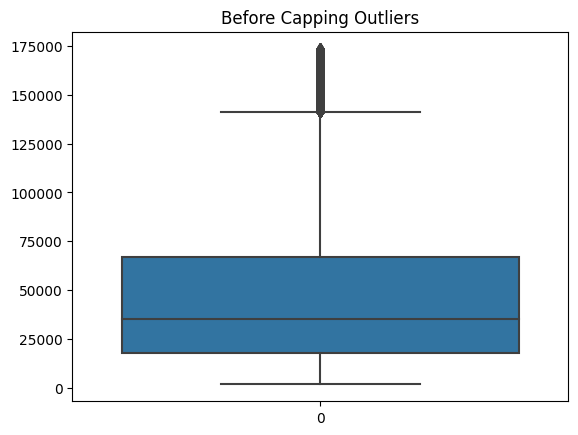

In [62]:
sns.boxplot(new_df['avg_price_brl'])
plt.title('Before Capping Outliers')
plt.show()

In [63]:

def cap_outliers(df):

  Q1 = np.percentile(df['avg_price_brl'], 25, method='midpoint')
  Q3 = np.percentile(df['avg_price_brl'], 75, method='midpoint')
  IQR = Q3 - Q1

  print("Old Shape: ", df.shape)

  # Upper bound
  upper = np.where(df['avg_price_brl'] >= (Q3 + 1 * IQR))
  # Lower bound
  lower = np.where(df['avg_price_brl'] <= (Q1 - 1 * IQR))

  # Copy the DataFrame and remove the outliers
  final_df = df.copy()
  final_df.drop(upper[0], inplace=True)
  final_df.drop(lower[0], inplace=True)

  print("New Shape: ", final_df.shape)

  return final_df


new_df = cap_outliers(new_df)

Old Shape:  (515322, 10)
New Shape:  (473675, 10)


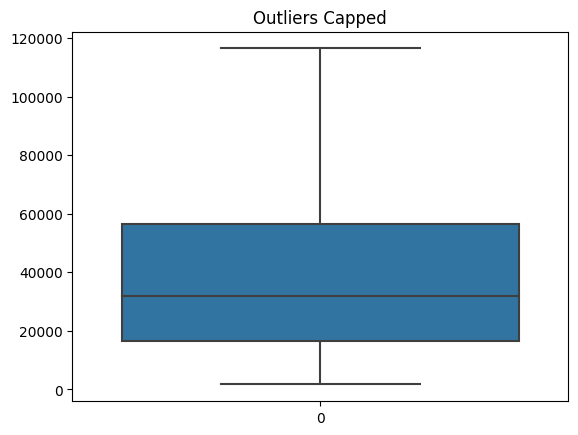

In [64]:
sns.boxplot(new_df['avg_price_brl'])
plt.title('Outliers Capped')
plt.show()

# Preprocessing New data

In [65]:
new_x, new_y = new_df.drop('avg_price_brl', axis = 1), new_df['avg_price_brl']


# Load the model, scaler and target encoder
with open('scaler.pickle', 'rb') as f:
    loaded_scaler = pickle.load(f)

with open('target-encoder.pickle', 'rb') as f:
    loaded_enc = pickle.load(f)


# binary encoding gear
new_x['gear'] = new_x['gear'].replace({'manual': 0, 'automatic': 1})

# ordinal encoding fuel
fuel_type = {'Gasoline': 0, 'Diesel': 1, 'Alcohol': 2}
new_x['fuel'] = new_x['fuel'].replace(fuel_type)

# applying the fittef target encoder to new data
new_x[cat_data] = loaded_enc.transform(new_x[cat_data])

# scaling
new_x[num_data] = loaded_scaler.transform(new_x[num_data])

new_x.head()

,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,age_years
0,-1.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.382268,1.159466
1,-1.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.493669,1.270867
2,-1.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.605070,1.382268
3,-1.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.716471,1.493669
4,-1.0,51073.68982,26142.964056,41524.068039,0,0,0.981391,-1.827872,1.605070


## Adding predictions to the dataframe

In [66]:
preds = rf_regressor.predict(new_x)
new_df['predicted_price'] = preds

## Plotting Results

In [67]:
new_df.head()

,year_of_reference,month_of_reference,brand,model,fuel,gear,engine_size,year_model,avg_price_brl,age_years,predicted_price
0,2021,January,Acura,NSX 3.0,Gasoline,manual,3.0,1995,40374.0,26,43900.38
1,2021,January,Acura,NSX 3.0,Gasoline,manual,3.0,1994,38939.0,27,43125.70
2,2021,January,Acura,NSX 3.0,Gasoline,manual,3.0,1993,37648.0,28,42509.62
3,2021,January,Acura,NSX 3.0,Gasoline,manual,3.0,1992,35962.0,29,40589.76
4,2021,January,Acura,NSX 3.0,Gasoline,manual,3.0,1991,32863.0,30,38952.57


In [68]:
year_2023 = new_df[new_df['year_of_reference'] == 2023]

fig = px.scatter(
                x=year_2023['avg_price_brl'], y=year_2023['predicted_price'], labels={'x': 'Actual Average Price', 'y': 'Predicted Average Price'},
                title=f"Average Car Price Predictions with {str(rf_regressor).split('(')[0]} for 2023", opacity=0.65,
                trendline='ols', trendline_color_override='cyan'
            )

fig.show()

In [69]:
year_2023 = year_2023.drop('predicted_price', axis = 1)
year_2023.to_csv('2023_cars.csv')

In [70]:
import json

categories = {
    'year_model':df['year_model'].unique().tolist(),
    'fuel': df['fuel'].unique().tolist(),
    'gear': df['gear'].unique().tolist(),
    'year_of_reference': df['year_of_reference'].unique().tolist(),
    'car_name': df['model'].unique().tolist(),
    'brand': df['brand'].unique().tolist(),
    'gear':df['gear'].unique().tolist(),
    'engine_size': df['engine_size'].unique().tolist(),
    'month_of_reference': df['month_of_reference'].unique().tolist()}

# saving car names

filename = 'categories.json'
with open(filename, 'w') as json_file:
    json.dump(categories, json_file)

